In [1]:
import Decomposer as dc
import IPython
import speech_recognition
import numpy as np
import StyleTransfer
import librosa

You are using pip version 8.1.2, however version 18.0 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


# Speech preprocessing

##### В этой секции реализованы различные способы предобработки входной аудиодорожки:

==================================================================================================================
1. Декомпозиция на речь и фон
2. Нормализация звука

**Дополнительно:**
3. Распознавание речи
4. Удаление пауз и незначимых междометий
5. Ускорение дорожки

==================================================================================================================


### Декомпозиция и нормализация
Здесь звук разделяется на две составляющие -- `front` и `back`. Последний содержит басы и фоновый шум, которые мы не будем трансферить.  

/opt/conda/lib/python3.5/site-packages/numpy/core/numeric.py:492: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


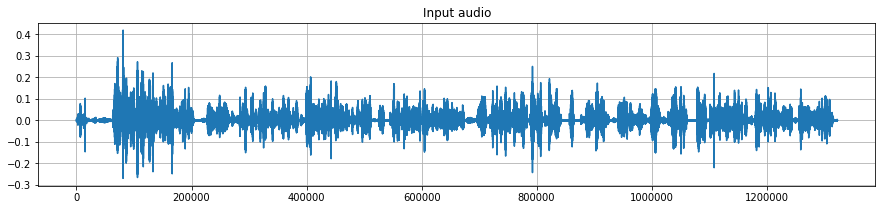

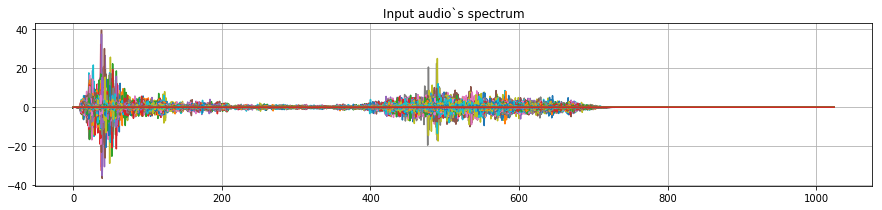

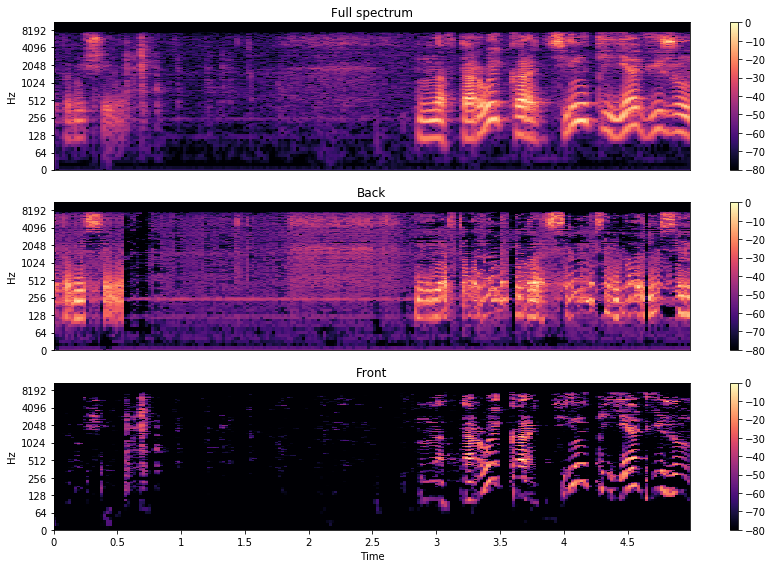

In [2]:
'''
    sr -- sample rate
    audio -- исходный звук
    front, back -- элементы декомпозиции
    draw_plots -- рисует графики по желанию пользователя
    
'''
front, back, sr, audio = dc.decompose('Audio/Example_1.wav',draw_plots=True)

In [3]:
IPython.display.Audio('Audio/Example_1.wav', rate=sr)

In [4]:
#часть, которая останется для тюнинга
IPython.display.Audio('front.wav', rate=sr)

In [5]:
IPython.display.Audio('back.wav', rate=sr)

### Дополнительные фичи

In [6]:
audio,sr, r = dc.Read_Audio('Audio/Example_man.wav')

/opt/conda/lib/python3.5/site-packages/numpy/core/numeric.py:492: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [7]:
audio = audio[:int(len(audio)/5)]

In [8]:
IPython.display.Audio(audio, rate=sr)

In [9]:
without_escapes=dc.eliminate_escapes(audio)

<built-in function max>


In [10]:
IPython.display.Audio(without_escapes, rate=sr)

In [19]:
without_escapes_tuned_speed=dc.tune_speed(without_escapes,1.5)

In [20]:
IPython.display.Audio(without_escapes_tuned_speed, rate=sr)

In [ ]:
### Style Transfer